<a href="https://colab.research.google.com/github/Rubina-Fathima/Bank-Marketing-Effectiveness-Prediction/blob/main/bank_df.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Predicting the effectiveness of bank marketing campaigns </u></b>

## <b> Problem Description </b>

### The data is related with direct marketing campaigns (phone calls) of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed. The classification goal is to predict if the client will subscribe a term deposit (variable y).



## <b> Data Description </b>

## <b>Input variables: </b>
### <b> Bank Client data: </b>

* ### age (numeric)
* ### job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
* ### marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
* ### education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
* ### default: has credit in default? (categorical: 'no','yes','unknown')
* ### housing: has housing loan? (categorical: 'no','yes','unknown')
* ### loan: has personal loan? (categorical: 'no','yes','unknown')

### <b> Related with the last contact of the current campaign:</b>
* ### contact: contact communication type (categorical: 'cellular','telephone')
* ### month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
* ### day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
* ### duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

### <b>Other attributes: </b>
* ### campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
* ### pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
* ### previous: number of contacts performed before this campaign and for this client (numeric)
* ### poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')


### <b>Output variable (desired target):</b>
* ### y - has the client subscribed a term deposit? (binary: 'yes','no')

## **Loading Libraries & Data**

In [1]:
import numpy as np
import pandas as pd
import random
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
%matplotlib inline

from prettytable import PrettyTable
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, KFold, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve, log_loss, classification_report, precision_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from imblearn.under_sampling import NearMiss
from collections import Counter
from xgboost import XGBClassifier
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek
from sklearn.neighbors import KNeighborsClassifier

import warnings
warnings.filterwarnings('ignore')

In [2]:
#mounting drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#Loading Dataset
bank_df= pd.read_csv('/content/drive/MyDrive/Bank Marketing Effectiveness Prediction/Copy of bank-full.csv',delimiter=';')

####**Analyzing Dataset**

In [41]:
bank_df.head(10)


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no


In [5]:
bank_df.dtypes

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object

In [18]:
bank_df.columns


Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [55]:
#Shape of the Dataset
bank_df.shape

(45211, 17)

In [42]:
bank_df.select_dtypes(include=['object'])

,job,marital,education,default,housing,loan,contact,month,poutcome,y
0,management,married,tertiary,no,yes,no,unknown,may,unknown,no
1,technician,single,secondary,no,yes,no,unknown,may,unknown,no
2,entrepreneur,married,secondary,no,yes,yes,unknown,may,unknown,no
3,blue-collar,married,unknown,no,yes,no,unknown,may,unknown,no
4,unknown,single,unknown,no,no,no,unknown,may,unknown,no
...,...,...,...,...,...,...,...,...,...,...
45206,technician,married,tertiary,no,no,no,cellular,nov,unknown,yes
45207,retired,divorced,primary,no,no,no,cellular,nov,unknown,yes
45208,retired,married,secondary,no,no,no,cellular,nov,success,yes
45209,blue-collar,married,secondary,no,no,no,telephone,nov,unknown,no


In [ ]:
# View the data of top 5 rows to take a glimps of the data
bank_df.head()

In [ ]:
# View the data of bottom 5 rows to take a glimps of the data
bank_df.tail()

#### **Information About Dataset**

In [ ]:
bank_df.info()

#### **Information About Dataset**

In [ ]:
bank_df.isnull().sum()

 **There is no null values in the dataset**

#### **Summary Statastics**

In [ ]:
bank_df.describe()

**Target Variable**

In [ ]:
bank_df.y.value_counts()

**As We Can See that Data is highly imbalanced.
Here we have divided dependant variable 'y' with respect to values in it ,i.e ('yes','no').From the above code we see that value count of 'yes' holds higher than value counts of 'no' .Hence there is a imbalance.**


### **List of numeric columns**

In [ ]:
numerical_cols = list(bank_df.select_dtypes(exclude=['object']))
numerical_cols

### **List of Categorical columns**

In [ ]:
category_cols = list(bank_df.select_dtypes(include=['object']))
category_cols

# **EDA On Dataset**

#### **On Target Variable**

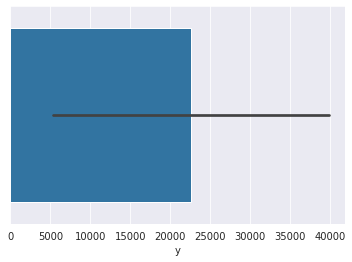

In [58]:
sizes = bank_df.y.value_counts()
sizes
sns.barplot(sizes)
plt.show()

In [43]:
#Here create a copy if data and proceed to further analysis
bank_df_copy=bank_df.copy()
bank_df_copy['y'] =bank_df_copy['y'].astype('category').cat.codes
X=bank_df_copy.iloc[:, 0:16]
y=bank_df_copy['y']
#Assign all catagoriacla features to a variable
categorical_features=list(bank_df_copy.select_dtypes(['object','category']).columns)
categorical_features=pd.Index(categorical_features)
categorical_features
#writing a function to perform encoding of categorical features of entire dataset
def one_hot_encoding(X, column):
    X= pd.concat([X, pd.get_dummies(X[column], prefix=column, drop_first=True)], axis=1)
    X= X.drop([column], axis=1)
    return X

for col in categorical_features:
    X= one_hot_encoding(X, col)
X.head() 

## Concatenate the Data Frames

#bank_df=pd.concat([bank_df,job ,	marital, 	education, 	default, 	housing, 	loan, 	contact, 	month, 	poutcome ,	y],axis=1)

## Drop Unnecessary columns
#bank_df=bank_df.drop(['job' ,	'marital', 	'education', 	'default', 	'housing', 	'loan', 	'contact', 	'month', 	'poutcome' ,	'y'],axis=1)

#bank_df

,age,balance,day,duration,campaign,pdays,previous,job_blue-collar,job_entrepreneur,job_housemaid,...,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,poutcome_unknown
0,58,2143,5,261,1,-1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
1,44,29,5,151,1,-1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,33,2,5,76,1,-1,0,0,1,0,...,0,0,0,1,0,0,0,0,0,1
3,47,1506,5,92,1,-1,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
4,33,1,5,198,1,-1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1


In [8]:


# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)



In [9]:
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier()
classifier.fit(X_train,y_train)



RandomForestClassifier()

In [10]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=b8015180c7e0e3bbaacc2e6f37be3bdb1939fb9039f8e56f2455cb0c10bdd6d6
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [27]:
import lime
from lime import lime_tabular

interpretor = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),feature_names=X_train.columns,mode='classification')

In [26]:
X_test.iloc[4]

age          30.0
job           NaN
marital       NaN
education     NaN
default       NaN
balance       0.0
housing       NaN
loan          NaN
contact       NaN
day           2.0
month         NaN
duration     95.0
campaign      3.0
pdays        -1.0
previous      0.0
poutcome      NaN
Name: 12505, dtype: float64

In [25]:


exp = interpretor.explain_instance(
    data_row=X_test.iloc[5], ##new data
    predict_fn=classifier.predict_proba
)

exp.show_in_notebook(show_table=True)



IndexError: ignored

In [32]:
# Model 2 - XGB Classifier
from sklearn.model_selection import train_test_split
validation_size = 0.2
seed = 7
X_train, X_validation, y_train, y_validation = train_test_split(X, y, test_size=validation_size, random_state=seed)
model_xgb = XGBClassifier()
model_xgb.fit(X_train, y_train)
print("Xgboost Accuracy =",accuracy_score(y_validation, model_xgb.predict(X_validation)))
exp = interpretor.explain_instance(
    data_row=X_test.iloc[5], ##new data
    predict_fn=classifier.predict_proba
)

exp.show_in_notebook(show_table=True)

Xgboost Accuracy = 0.9130819418334624


In [16]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 575.9/575.9 KB 10.4 MB/s eta 0:00:00


In [17]:
from sklearn.tree import export_graphviz
from sklearn.tree import DecisionTreeClassifier
import shap 
import graphviz
sns.set_style('darkgrid') 

In [29]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


In [24]:
# Initialize JavaScript visualizations in notebook environment
shap.initjs()

In [54]:
X

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown


classification report :               precision    recall  f1-score   support

           0       0.99      0.98      0.98      7980
           1       0.88      0.89      0.89      1063

    accuracy                           0.97      9043
   macro avg       0.93      0.94      0.94      9043
weighted avg       0.97      0.97      0.97      9043



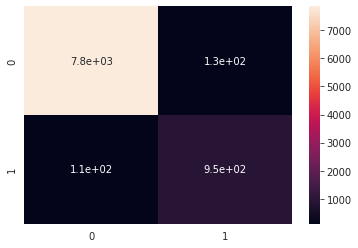

In [52]:
bank_df_copy=bank_df.copy()
#bank_df_copy['y'] =bank_df_copy['y'].astype('category').cat.codes
X=bank_df_copy.iloc[:, 0:16]
y=bank_df_copy['y']
# Decision Tree Classifier
classifier_dtc = DecisionTreeClassifier()
classifier_dtc.fit(X_train, y_train)
# Predicting the Test set results
y_pred= classifier_dtc.predict(X_test)
# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
clf_rpt = classification_report(y_test,y_pred)
print("classification report :", clf_rpt)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm,annot=True)

In [53]:
shap.initjs()
# Visualize how model classified the entire data
tree_graph = export_graphviz(classifier_dtc, out_file=None, rounded=True, filled=True)
graphviz.Source(tree_graph)

In [47]:
# Extract features
float_columns=[]
cat_columns=[]
int_columns=[]
# Putting features into respective float, cat , int list.
for i in bank_df.columns:
    if bank_df[i].dtype == 'float' : 
        float_columns.append(i)
    elif bank_df[i].dtype == 'int64':
        int_columns.append(i)
    elif bank_df[i].dtype == 'object':
        cat_columns.append(i)
bank_cat_features = bank_df[cat_columns]
bank_float_features = bank_df[float_columns]
bank_int_features = bank_df[int_columns]
# Line-up the feature names
feature_names_cat = list(bank_cat_features)
feature_names_float = list(bank_float_features)
feature_names_int = list(bank_int_features)

feature_names1 = sum([feature_names_cat, feature_names_float, feature_names_int], [])
print(feature_names1)

['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome', 'y', 'age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']


In [51]:
shap.initjs()
# Define a tree explainer for the built model
explainer = shap.TreeExplainer(classifier_dtc)
# obtain shap values for the first row of the test data
shap_values= explainer.shap_values(X_test.iloc[0])
shap.force_plot(explainer.expected_value[0],shap_values[0],X_test.iloc[0]) 

In [38]:
X_test.iloc[0]

age                      37
balance                1403
day                      10
duration                 91
campaign                 15
pdays                    -1
previous                  0
job_blue-collar           0
job_entrepreneur          0
job_housemaid             0
job_management            1
job_retired               0
job_self-employed         0
job_services              0
job_student               0
job_technician            0
job_unemployed            0
job_unknown               0
marital_married           1
marital_single            0
education_secondary       0
education_tertiary        1
education_unknown         0
default_yes               0
housing_yes               1
loan_yes                  0
contact_telephone         0
contact_unknown           0
month_aug                 0
month_dec                 0
month_feb                 0
month_jan                 0
month_jul                 1
month_jun                 0
month_mar                 0
month_may           

In [39]:
X_test.mean()

age                      40.992370
balance                1322.956762
day                      15.787570
duration                259.818755
campaign                  2.799292
pdays                    41.060821
previous                  0.566737
job_blue-collar           0.219286
job_entrepreneur          0.031848
job_housemaid             0.030079
job_management            0.200708
job_retired               0.049983
job_self-employed         0.034502
job_services              0.094659
job_student               0.020679
job_technician            0.163773
job_unemployed            0.028088
job_unknown               0.006746
marital_married           0.606878
marital_single            0.278447
education_secondary       0.510892
education_tertiary        0.290722
education_unknown         0.044565
default_yes               0.017472
housing_yes               0.563309
loan_yes                  0.162667
contact_telephone         0.061484
contact_unknown           0.296030
month_aug           